In [ ]:
pip install ftfy

In [21]:
# Start by assessing which 5 companies we will analyse. Firstly we need to combine the stock price files into one

In [1]:
import os
import pandas as pd

folder = r"C:\Users\fergu\OneDrive\Documents\Masters in Data Analytics\CA\msc-da-integrated-ca2-sem2-sba24330\stockprice"

row_counts = {}

for file in os.listdir(folder):
    if file.endswith(".csv"):
        try:
            df = pd.read_csv(os.path.join(folder, file))
            row_counts[file] = len(df)
        except:
            continue

# Print row count for each file
for file, count in sorted(row_counts.items(), key=lambda x: x[1], reverse=True):
    print(f"{file}: {count} rows")


merged_stock_data.csv: 1270 rows
AAPL.csv: 254 rows
AMT.csv: 254 rows
AMZN.csv: 254 rows
BA.csv: 254 rows
BABA.csv: 254 rows
BAC.csv: 254 rows
BKNG.csv: 254 rows
BRK-A.csv: 254 rows
BRK-B.csv: 254 rows
CCL.csv: 254 rows
CVX.csv: 254 rows
DIS.csv: 254 rows
FB.csv: 254 rows
GOOG.csv: 254 rows
GOOGL.csv: 254 rows
HD.csv: 254 rows
JNJ.csv: 254 rows
JPM.csv: 254 rows
KO.csv: 254 rows
LOW.csv: 254 rows
MA.csv: 254 rows
MCD.csv: 254 rows
META.csv: 254 rows
MSFT.csv: 254 rows
NFLX.csv: 254 rows
NKE.csv: 254 rows
NVDA.csv: 254 rows
PFE.csv: 254 rows
PG.csv: 254 rows
PYPL.csv: 254 rows
SBUX.csv: 254 rows
TM.csv: 254 rows
TSLA.csv: 254 rows
TSM.csv: 254 rows
UNH.csv: 254 rows
UPS.csv: 254 rows
V.csv: 254 rows
WMT.csv: 254 rows
XOM.csv: 254 rows
^GSPC.csv: 254 rows
ABNB.csv: 15 rows


In [3]:
import pandas as pd

# Load dataset
df = pd.read_csv("stocktweet.csv")

# Find top 5 tickers by number of tweets
top_5_tickers = df['ticker'].value_counts().nlargest(5).index.tolist()

# Filter the DataFrame to include only top 5
df_top5 = df[df['ticker'].isin(top_5_tickers)].copy()

# P result
print("Top 5 tickers:", top_5_tickers)

Top 5 tickers: ['TSLA', 'AAPL', 'BA', 'DIS', 'AMZN']


In [5]:
import pandas as pd

# Load dataset
df = pd.read_csv("stocktweet.csv")

# Convert 'date' column to datetime using dayfirst format
df['date'] = pd.to_datetime(df['date'], dayfirst=True, errors='coerce')

# Drop rows where date conversion failed (if any)
df = df.dropna(subset=['date'])

# Count the number of unique dates with tweets per ticker
tweet_days_per_ticker = df.groupby('ticker')['date'].nunique()

# Get top 5 tickers with the most active tweet days
top_5_tickers = tweet_days_per_ticker.nlargest(5).index.tolist()

# Filter the DataFrame to include only those top 5 tickers
df_top5 = df[df['ticker'].isin(top_5_tickers)].copy()

# Print the result
print("Top 5 tickers by number of tweet-active days:", top_5_tickers)


Top 5 tickers by number of tweet-active days: ['AAPL', 'TSLA', 'BA', 'AMZN', 'DIS']


In [25]:
# so for our analysis we will look at 'TSLA', 'AAPL', 'BA', 'DIS', 'AMZN' as they have the most complete dataset

In [7]:
from ftfy import fix_text

characters = "ðŸ¥³"
fixed = fix_text(characters)
print(fixed)  # 🥳

🥳


In [15]:
pip install demoji


Note: you may need to restart the kernel to use updated packages.


In [9]:
import demoji

def emoji_to_text(emoji_text):
    emoji_map = demoji.findall(emoji_text)
    for char, desc in emoji_map.items():
        emoji_text = emoji_text.replace(char, desc)
    return emoji_text


In [11]:
from ftfy import fix_text
import demoji

def clean_mojibake_to_meaningful_text(text):
    fixed = fix_text(text)                        
    emoji_map = demoji.findall(fixed)
    for emoji_char, desc in emoji_map.items():
        fixed = fixed.replace(emoji_char, desc)   
    return fixed


text = "ðŸ¥³"
print(clean_mojibake_to_meaningful_text(text))  


partying face


In [13]:
import pandas as pd
from ftfy import fix_text
import demoji

stocktweet_cleaned = pd.read_csv("stocktweet.csv")

# Fix mojibake  and convert emojis to plain text
def clean_mojibake_to_meaningful_text(text):
    fixed = fix_text(text)
    emoji_map = demoji.findall(fixed)
    for emoji_char, desc in emoji_map.items():
        fixed = fixed.replace(emoji_char, desc)
    return fixed

# Apply the cleaning function
stocktweet_cleaned['meaningful_text'] = stocktweet_cleaned['tweet'].apply(clean_mojibake_to_meaningful_text)

print(stocktweet_cleaned[['tweet', 'meaningful_text']].head())


                                               tweet  \
0       $AMZN Dow futures up by 100 points already 🥳   
1  $TSLA Daddy's drinkin' eArly tonight! Here's t...   
2  $AAPL We’ll been riding since last December fr...   
3            $TSLA happy new year, 2020, everyone🍷🎉🙏   
4  $TSLA haha just a collection of greats..."Mars...   

                                     meaningful_text  
0  $AMZN Dow futures up by 100 points already par...  
1  $TSLA Daddy's drinkin' eArly tonight! Here's t...  
2  $AAPL We'll been riding since last December fr...  
3  $TSLA happy new year, 2020, everyonewine glass...  
4  $TSLA haha just a collection of greats..."Mars...  


In [29]:
#the above converts emojis into text. So now eer are ready to perform sentiment analysis

In [27]:
# I tried used FinBert for sentiment analysis but there results were poor. I thought using a finance based model would have good results but infact 
# most of the tweets are that finance talk, its social media talk, with emojis etc. So instead we will use Vander as it's trained on twitter (per class)

In [31]:
# we also want to remove stop words as they can impact on sentiment analysis. discuss more in word doc

In [23]:
#pip install nltk

Note: you may need to restart the kernel to use updated packages.


In [15]:
import nltk

In [17]:
nltk.download([
            "names",
            "stopwords",
            "state_union",
            "twitter_samples",
            "movie_reviews",
            "averaged_perceptron_tagger",
            "vader_lexicon",
            "punkt",
        ])

[nltk_data] Downloading package names to
[nltk_data]     C:\Users\fergu\AppData\Roaming\nltk_data...
[nltk_data]   Package names is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\fergu\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package state_union to
[nltk_data]     C:\Users\fergu\AppData\Roaming\nltk_data...
[nltk_data]   Package state_union is already up-to-date!
[nltk_data] Downloading package twitter_samples to
[nltk_data]     C:\Users\fergu\AppData\Roaming\nltk_data...
[nltk_data]   Package twitter_samples is already up-to-date!
[nltk_data] Downloading package movie_reviews to
[nltk_data]     C:\Users\fergu\AppData\Roaming\nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\fergu\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up

True

In [19]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

df = pd.read_csv('stocktweet_cleaned.csv')

stop_words = set(stopwords.words('english'))

# Function to remove stopwords 
def remove_stopwords(text):
    tokens = word_tokenize(str(text))
    filtered_tokens = [word for word in tokens if word.lower() not in stop_words]
    return ' '.join(filtered_tokens)

# Apply the function 
df['cleaned_text'] = df['meaningful_text'].apply(remove_stopwords)

print(df[['meaningful_text', 'cleaned_text']].head())

                                     meaningful_text  \
0  $AMZN Dow futures up by 100 points already par...   
1  $TSLA Daddy's drinkin' eArly tonight! Here's t...   
2  $AAPL We'll been riding since last December fr...   
3  $TSLA happy new year, 2020, everyonewine glass...   
4  $TSLA haha just a collection of greats..."Mars...   

                                        cleaned_text  
0  $ AMZN Dow futures 100 points already partying...  
1  $ TSLA Daddy 's drinkin ' eArly tonight ! 's P...  
2  $ AAPL 'll riding since last December $ 172.12...  
3  $ TSLA happy new year , 2020 , everyonewine gl...  
4  $ TSLA haha collection greats ... '' Mars '' r...  


In [21]:
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

stop_words = set(stopwords.words('english'))

# Function to remove stopwords 
def remove_stopwords(text):
    tokens = word_tokenize(str(text))
    filtered_tokens = [word for word in tokens if word.lower() not in stop_words]
    return ' '.join(filtered_tokens)

# Apply the function 
stocktweet_cleaned['cleaned_text'] = stocktweet_cleaned['meaningful_text'].apply(remove_stopwords)

print(stocktweet_cleaned[['meaningful_text', 'cleaned_text']].head())

                                     meaningful_text  \
0  $AMZN Dow futures up by 100 points already par...   
1  $TSLA Daddy's drinkin' eArly tonight! Here's t...   
2  $AAPL We'll been riding since last December fr...   
3  $TSLA happy new year, 2020, everyonewine glass...   
4  $TSLA haha just a collection of greats..."Mars...   

                                        cleaned_text  
0  $ AMZN Dow futures 100 points already partying...  
1  $ TSLA Daddy 's drinkin ' eArly tonight ! 's P...  
2  $ AAPL 'll riding since last December $ 172.12...  
3  $ TSLA happy new year , 2020 , everyonewine gl...  
4  $ TSLA haha collection greats ... '' Mars '' r...  


In [51]:
# Ok, so now we have converted emojis into text and removed stop words, as shown above

In [53]:
# Now to apply a sentiment score to each tweet

In [23]:
from nltk.sentiment import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()
sia.polarity_scores("$HD Bought more at today's low. She is turning. Stars aligned.crossed fingers")


{'neg': 0.177, 'neu': 0.823, 'pos': 0.0, 'compound': -0.3321}

In [25]:
import pandas as pd
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

sia = SentimentIntensityAnalyzer()

# Define function to get VADER sentiment
def get_vader_sentiment(text):
    scores = sia.polarity_scores(str(text))
    compound = scores['compound']

    # Classify sentiment based on compound score
    if compound >= 0.05:
        sentiment = 'Positive'
    elif compound <= -0.05:
        sentiment = 'Negative'
    else:
        sentiment = 'Neutral'

    return pd.Series([scores['neg'], scores['neu'], scores['pos'], compound, sentiment])

# Apply the sentiment analysis to the cleaned_text column
stocktweet_cleaned[['neg', 'neu', 'pos', 'compound', 'sentiment']] = stocktweet_cleaned['cleaned_text'].apply(get_vader_sentiment)


# Print sentiment distribution
print(stocktweet_cleaned['sentiment'].value_counts())

sentiment
Positive    5431
Neutral     2511
Negative    2058
Name: count, dtype: int64


In [27]:
selected_tickers = ['TSLA', 'AAPL', 'BA', 'DIS', 'AMZN']

# Filter the DataFrame
stocktweet_cleaned = stocktweet_cleaned[stocktweet_cleaned['ticker'].isin(selected_tickers)]

print(stocktweet_cleaned.head())

       id        date ticker  \
0  100001  01/01/2020   AMZN   
1  100002  01/01/2020   TSLA   
2  100003  01/01/2020   AAPL   
3  100004  01/01/2020   TSLA   
4  100005  01/01/2020   TSLA   

                                               tweet  \
0       $AMZN Dow futures up by 100 points already 🥳   
1  $TSLA Daddy's drinkin' eArly tonight! Here's t...   
2  $AAPL We’ll been riding since last December fr...   
3            $TSLA happy new year, 2020, everyone🍷🎉🙏   
4  $TSLA haha just a collection of greats..."Mars...   

                                     meaningful_text  \
0  $AMZN Dow futures up by 100 points already par...   
1  $TSLA Daddy's drinkin' eArly tonight! Here's t...   
2  $AAPL We'll been riding since last December fr...   
3  $TSLA happy new year, 2020, everyonewine glass...   
4  $TSLA haha just a collection of greats..."Mars...   

                                        cleaned_text  neg    neu    pos  \
0  $ AMZN Dow futures 100 points already partying...  0.0 

In [63]:
# Next we need to get the average sentiment where there is more than one tweet per day per ticker, merge the results. Also how
# will I deal with days where there are no tweets. usaually NA is 0, but that is already equal to neutral sentiment. Perhaps have a seperate
# comlumn for each sentiment. This might make more sense as I'd expect neutral sentiment scores to have no impact on price but postive & negative 
# score to have an impact. so it's best to have these as seperate varibles/columns.

In [73]:
# Talk about how most people posting on social media regarding stocks tend to be overallly bullish, trying to convince others to buy the same
# stock the own already. They are not professionals who have impartical and professional expertise. And althoyugh it appreas as if Vader has 
# done a good job converting the text into accuarate sentiment, I myself don't always understand the sloang used or emojis

In [29]:
# Group by date and ticker and take the average of the compound score
stocktweet_sentiment = stocktweet_cleaned.groupby(['date', 'ticker'], as_index=False)['compound'].mean()

# Define sentiment classification 
def classify_sentiment(compound):
    if compound >= 0.05:
        return 'Positive'
    elif compound <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

stocktweet_sentiment['sentiment'] = stocktweet_sentiment['compound'].apply(classify_sentiment)
# Save to CSV
stocktweet_sentiment.to_csv("stocktweet_sentiment.csv", index=False)

print(stocktweet_sentiment.head(20))

          date ticker  compound sentiment
0   01/01/2020   AAPL  0.000000   Neutral
1   01/01/2020   AMZN  0.381800  Positive
2   01/01/2020   TSLA  0.124525  Positive
3   01/02/2020   AAPL  0.194200  Positive
4   01/02/2020   AMZN  0.401900  Positive
5   01/02/2020   TSLA  0.504000  Positive
6   01/03/2020   AAPL  0.440400  Positive
7   01/04/2020   AAPL -0.267167  Negative
8   01/04/2020     BA  0.376333  Positive
9   01/04/2020    DIS  0.013138   Neutral
10  01/04/2020   TSLA -0.271150  Negative
11  01/05/2020   AAPL  0.504650  Positive
12  01/05/2020   AMZN  0.186000  Positive
13  01/05/2020     BA  0.659267  Positive
14  01/05/2020    DIS  0.308033  Positive
15  01/05/2020   TSLA  0.192740  Positive
16  01/06/2020   AAPL  0.416100  Positive
17  01/06/2020   TSLA  0.108800  Positive
18  01/07/2020   AMZN  0.682750  Positive
19  01/07/2020     BA -0.029467   Neutral


In [75]:
# Now we can one hot encode so we have a seperate column for each sentiment/variable as done in our class notes: Sentiment Analysis (Opinion Mining) with 
# Python — NLP Tutorial. We need to one hot encode as our model can't work with text

In [31]:
stocktweet_sentiment['sentiment'] = stocktweet_sentiment['sentiment'].astype(str).str.strip().str.capitalize()

# One-hot encode sentiment column
stocktweet_sentiment = pd.get_dummies(stocktweet_sentiment, columns=['sentiment'])

# Convert binary columns to integer type
for col in ['sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']:
    if col in stocktweet_sentiment.columns:
        stocktweet_sentiment[col] = stocktweet_sentiment[col].astype(int)

print(stocktweet_sentiment.head())


         date ticker  compound  sentiment_Negative  sentiment_Neutral  \
0  01/01/2020   AAPL  0.000000                   0                  1   
1  01/01/2020   AMZN  0.381800                   0                  0   
2  01/01/2020   TSLA  0.124525                   0                  0   
3  01/02/2020   AAPL  0.194200                   0                  0   
4  01/02/2020   AMZN  0.401900                   0                  0   

   sentiment_Positive  
0                   0  
1                   1  
2                   1  
3                   1  
4                   1  


In [81]:
# Now we are ready to join our sentiment dataset with the financial data. Make sure to only return necessary columns
# in word doc, exlain why I chose the following

In [83]:
#Next we take a look at the stock price file

In [33]:
import pandas as pd
import os

folder_path = r"C:\Users\fergu\OneDrive\Documents\Masters in Data Analytics\CA\msc-da-integrated-ca2-sem2-sba24330\stockprice"

file_names = {
    "AAPL": "AAPL.csv",
    "AMZN": "AMZN.csv",
    "BA": "BA.csv",
    "DIS": "DIS.csv",
    "TSLA": "TSLA.csv"
}

# Read and label each file
merged_data = []

for ticker, file_name in file_names.items():
    file_path = os.path.join(folder_path, file_name)
    df = pd.read_csv(file_path)
    df['ticker'] = ticker
    merged_data.append(df)

# Combine all into one DataFrame
stock_price = pd.concat(merged_data, ignore_index=True)


print(stock_price.head())

         Date       Open       High        Low      Close  Adj Close  \
0  2019-12-31  72.482498  73.419998  72.379997  73.412498  71.520821   
1  2020-01-02  74.059998  75.150002  73.797501  75.087502  73.152649   
2  2020-01-03  74.287498  75.144997  74.125000  74.357498  72.441460   
3  2020-01-06  73.447502  74.989998  73.187500  74.949997  73.018677   
4  2020-01-07  74.959999  75.224998  74.370003  74.597504  72.675278   

      Volume ticker  
0  100805600   AAPL  
1  135480400   AAPL  
2  146322800   AAPL  
3  118387200   AAPL  
4  108872000   AAPL  


In [35]:
import pandas as pd
import os

folder_path = r"C:\Users\fergu\OneDrive\Documents\Masters in Data Analytics\CA\msc-da-integrated-ca2-sem2-sba24330\stockprice"

file_names = {
    "TSLA": "TSLA.csv"
}

# Read and label each file
merged_data = []

for ticker, file_name in file_names.items():
    file_path = os.path.join(folder_path, file_name)
    df = pd.read_csv(file_path)
    df['ticker'] = ticker
    merged_data.append(df)

# Combine all into one DataFrame
tsla_df = pd.concat(merged_data, ignore_index=True)


print(tsla_df.head())


tsla_df.to_csv("tsla_df.csv")


         Date       Open       High        Low      Close  Adj Close  \
0  2019-12-31  27.000000  28.086000  26.805332  27.888666  27.888666   
1  2020-01-02  28.299999  28.713333  28.114000  28.684000  28.684000   
2  2020-01-03  29.366667  30.266666  29.128000  29.534000  29.534000   
3  2020-01-06  29.364668  30.104000  29.333332  30.102667  30.102667   
4  2020-01-07  30.760000  31.441999  30.224001  31.270666  31.270666   

      Volume ticker  
0  154285500   TSLA  
1  142981500   TSLA  
2  266677500   TSLA  
3  151995000   TSLA  
4  268231500   TSLA  


In [37]:
#!pip install pandas

In [ ]:
#!pip install seaborn

In [39]:
import seaborn as sns

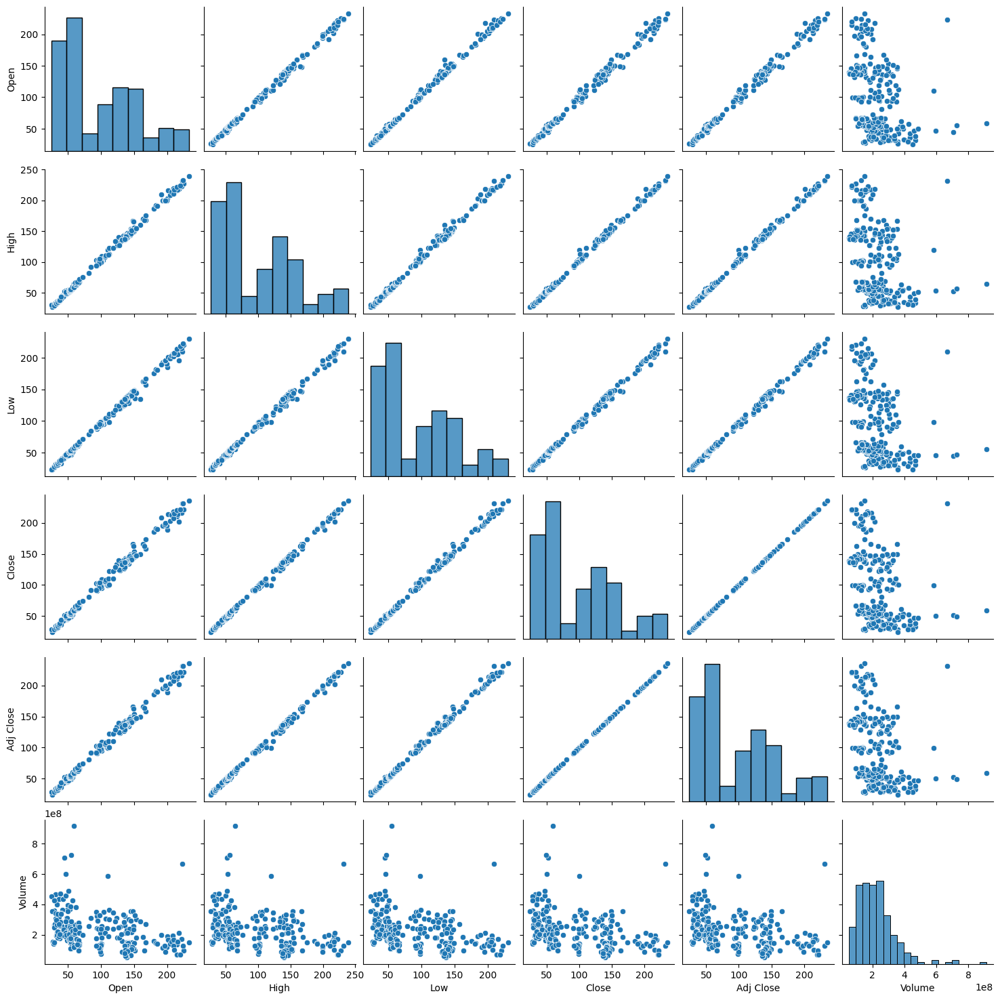

In [41]:
sns.pairplot(tsla_df)

In [9]:
# there is a relatonship between the variables except for volume

In [43]:
tsla_df.shape

(254, 8)

In [45]:
tsla_df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,254.000000,254.000000,254.000000,254.000000,254.000000,2.540000e+02
mean,96.096367,98.816569,93.303142,96.394913,96.394913,2.256418e+08
std,55.947472,57.294582,54.503561,56.385815,56.385815,1.202570e+08
min,24.980000,26.990667,23.367332,24.081333,24.081333,5.207310e+07
25%,49.244500,51.554335,47.545667,49.886168,49.886168,1.417980e+08
50%,76.815998,78.777668,75.536667,77.609665,77.609665,2.079998e+08
75%,140.457500,143.450001,136.811668,140.381660,140.381660,2.823401e+08
max,233.330002,239.573334,230.373337,235.223328,235.223328,9.140820e+08


In [27]:
# There is a big difference between min and max adj close price. So we will need to scale the data!!! which is verified by the distribution
# in the pairplot above, where the data is skewed to the right (most of the values are on the left and th tails stretches to the right therefore we 
# will use the Min Max scaler as the data is skewed. Note I need to filter for each stock and do the same analysis
# class 11th March - 25mins

In [85]:
# Now we are ready to join our sentiment dataset with the financial data. Make sure to only return necessary columns
# in word doc, exlain why I chose the following

In [47]:
import pandas as pd
import os

folder_path = r"C:\Users\fergu\OneDrive\Documents\Masters in Data Analytics\CA\msc-da-integrated-ca2-sem2-sba24330\stockprice"

file_names = {
    "AAPL": "AAPL.csv",
    "AMZN": "AMZN.csv",
    "BA": "BA.csv",
    "DIS": "DIS.csv",
    "TSLA": "TSLA.csv"
}

# Read and label each file
merged_data = []

for ticker, file_name in file_names.items():
    file_path = os.path.join(folder_path, file_name)
    df = pd.read_csv(file_path)
    df['ticker'] = ticker
    merged_data.append(df)

# Combine all into one DataFrame
stock_price = pd.concat(merged_data, ignore_index=True)


print(stock_price.head())

         Date       Open       High        Low      Close  Adj Close  \
0  2019-12-31  72.482498  73.419998  72.379997  73.412498  71.520821   
1  2020-01-02  74.059998  75.150002  73.797501  75.087502  73.152649   
2  2020-01-03  74.287498  75.144997  74.125000  74.357498  72.441460   
3  2020-01-06  73.447502  74.989998  73.187500  74.949997  73.018677   
4  2020-01-07  74.959999  75.224998  74.370003  74.597504  72.675278   

      Volume ticker  
0  100805600   AAPL  
1  135480400   AAPL  
2  146322800   AAPL  
3  118387200   AAPL  
4  108872000   AAPL  


In [49]:
#merge stock price file with stock tweets now including sentiment analsis/score
# Standardise column names as Date is spelt with cpital letters in one file
stocktweet_sentiment.rename(columns={'date': 'Date', 'Ticker': 'ticker'}, inplace=True)
stock_price.rename(columns={'Ticker': 'ticker'}, inplace=True)

# Convert Date columns to datetime
stocktweet_sentiment['Date'] = pd.to_datetime(stocktweet_sentiment['Date'], dayfirst=True)
stock_price['Date'] = pd.to_datetime(stock_price['Date'])

# Merge on Date and ticker
merged_df = pd.merge(
    stock_price[['Date', 'ticker', 'Adj Close']],
    stocktweet_sentiment[['Date', 'ticker', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']],
    on=['Date', 'ticker'],
    how='left'
)
# Fill NaNs in sentiment columns with 0
sentiment_cols = ['sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']
merged_df[sentiment_cols] = merged_df[sentiment_cols].fillna(0).astype(int)

# Set Date as the index


print(merged_df.head())


merged_df.to_csv("merged_sentiment_with_financialsv3.csv") #I check that there is 254 rows for each ticker

        Date ticker  Adj Close  sentiment_Negative  sentiment_Neutral  \
0 2019-12-31   AAPL  71.520821                   0                  0   
1 2020-01-02   AAPL  73.152649                   0                  0   
2 2020-01-03   AAPL  72.441460                   0                  0   
3 2020-01-06   AAPL  73.018677                   0                  0   
4 2020-01-07   AAPL  72.675278                   0                  1   

   sentiment_Positive  
0                   0  
1                   1  
2                   1  
3                   1  
4                   0  


In [151]:
#we've sucessfully merged the stock price dataset with the twwets file that now has the sentiment scores

In [ ]:
# filter the merged file by TSLA

In [51]:
tsla_data = merged_df[merged_df['ticker'] == 'TSLA']

tsla_data.to_csv("tsla_final.csv")

In [53]:
print(tsla_data.head())

           Date ticker  Adj Close  sentiment_Negative  sentiment_Neutral  \
1016 2019-12-31   TSLA  27.888666                   0                  0   
1017 2020-01-02   TSLA  28.684000                   1                  0   
1018 2020-01-03   TSLA  29.534000                   0                  0   
1019 2020-01-06   TSLA  30.102667                   0                  0   
1020 2020-01-07   TSLA  31.270666                   0                  0   

      sentiment_Positive  
1016                   0  
1017                   0  
1018                   1  
1019                   1  
1020                   1  


In [568]:
# the dataset is quite short, have one years worth of data. Therefore we need to take this into consideration when designing our model. We will 
# start by taking a larger training set. This may result in overfitting ....... but...

#Use shorter time windows (e.g. 5 days instead of 40)

#Reduce model complexity (e.g. fewer layers, fewer units).

#transfer learning- we can use what we've learn from training tsla model to train the other 4 companies>

In [55]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load and preprocess
df = pd.read_csv("tsla_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Use a 5-day sequence 
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i-5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split on 2020-11-30
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Define and train model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, epochs=50, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0990 - val_loss: 0.1307
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0292 - val_loss: 0.0992
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0128 - val_loss: 0.0544
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0077 - val_loss: 0.0079
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030 - val_loss: 0.0026
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018 - val_loss: 0.0023
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015 - val_loss: 0.0020
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017 - val_loss: 0.0023
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0019 - val_loss: 0.0017
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017 - val_loss: 0.0036
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0014 - val_l

In [534]:
#as expected, the further ahead we try to predict, the less accurate the score becomes

In [67]:
#pip install tensorflow scikit-learn

In [ ]:
from scikeras.wrappers import KerasRegressor

In [57]:
# Below code is change to raw as running it can slow the file. I've saved the results below

In [59]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load and preprocess
df = pd.read_csv("tsla_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Use a 5-day sequence 
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i - 5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split on 2020-11-30
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Define and train model using best GridSearchCV parameters
model = Sequential()
model.add(LSTM(64, input_shape=(x_train.shape[1], x_train.shape[2])))  # model__units = 64
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')  # model__optimizer = 'adam'
model.fit(
    x_train, y_train,
    epochs=100,                # epochs = 100
    batch_size=8,              # batch_size = 8
    validation_data=(x_test, y_test),
    verbose=1
)

# Predict
predictions = model.predict(x_test)

# Inverse transform
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)


Epoch 1/100


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.1257 - val_loss: 0.0964
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0173 - val_loss: 0.0078
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0032 - val_loss: 0.0129
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0022 - val_loss: 0.0033
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0024 - val_loss: 0.0038
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0016 - val_loss: 0.0043
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0018 - val_loss: 0.0034
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0015 - val_loss: 0.0033
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 10/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0015 - val_loss: 0.0055
Epoch 11/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0014 - val_loss: 0.0039
Epoch 12/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0013 - val_l

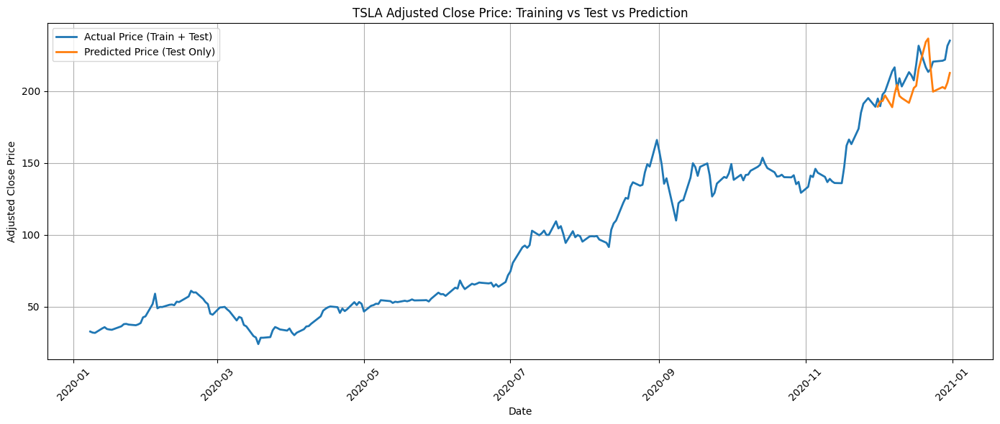

In [61]:
import matplotlib.pyplot as plt

# Combine y_train and y_test 
all_y = np.concatenate((y_train, y_test)).reshape(-1, 1)
all_y_padded = np.hstack((all_y, np.zeros((all_y.shape[0], 3))))
all_y_actual = scaler.inverse_transform(all_y_padded)[:, 0]

# Build full timeline of dates
full_dates = sequence_dates

# Plot
plt.figure(figsize=(14, 6))
plt.plot(full_dates, all_y_actual, label='Actual Price (Train + Test)', linewidth=2)
plt.plot(test_dates, y_pred_actual, label='Predicted Price (Test Only)', linewidth=2)


plt.title("TSLA Adjusted Close Price: Training vs Test vs Prediction")
plt.xlabel("Date")
plt.ylabel("Adjusted Close Price")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [536]:
# try again with less training data

In [63]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load and preprocess
df = pd.read_csv("tsla_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Use a 5-day sequence 
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i-5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split on 2020-10-31
split_date = pd.to_datetime("2020-10-31")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Define and train model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, epochs=50, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)


Epoch 1/50


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


13/13 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0417 - val_loss: 0.1938
Epoch 2/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0301 - val_loss: 0.1646
Epoch 3/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0173 - val_loss: 0.0729
Epoch 4/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0088 - val_loss: 0.0280
Epoch 5/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0027 - val_loss: 0.0062
Epoch 6/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0022 - val_loss: 0.0045
Epoch 7/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015 - val_loss: 0.0040
Epoch 8/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0017 - val_loss: 0.0054
Epoch 9/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015 - val_loss: 0.0043
Epoch 10/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012 - val_loss: 0.0042
Epoch 11/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0019 - val_loss: 0.0039
Epoch 12/50
13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0012 - val_loss: 0.003

In [540]:
# so one month less data for training has resulted in worse results, espically for day one. 

In [562]:
# if we had more data then moost likely the results would improve

Epoch 1/50


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.1133 - val_loss: 0.2182
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0212 - val_loss: 0.0141
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0106 - val_loss: 0.0296
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0058 - val_loss: 0.0066
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030 - val_loss: 0.0015
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021 - val_loss: 0.0030
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020 - val_loss: 0.0055
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 0.0033
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018 - val_loss: 0.0039
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019 - val_loss: 0.0024
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0021 - val_loss: 0.0031
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 0.0033

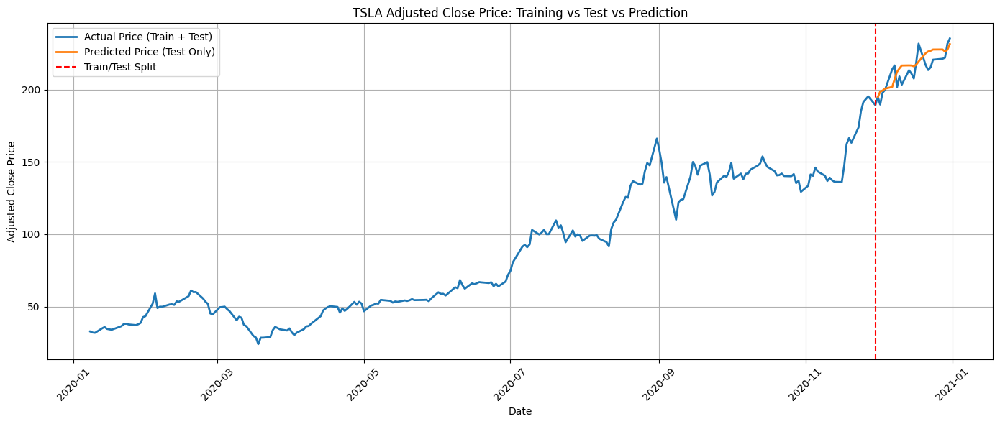

In [65]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt

# Load and preprocess
df = pd.read_csv("tsla_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Use only 'Adj Close'
adj_close = df[['Adj Close']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(adj_close)

# Generate 5-day sequences
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i - 5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predict 'Adj Close'

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split on 2020-11-30
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Define and train LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, epochs=50, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform
y_pred_actual = scaler.inverse_transform(predictions)
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices].flatten(),
    "Predicted": y_pred_actual[valid_indices].flatten(),
    "Absolute Error": np.abs(y_test_actual[valid_indices].flatten() - y_pred_actual[valid_indices].flatten())
})

print(results)

# Visualize predictions vs training data
all_y = np.concatenate((y_train, y_test)).reshape(-1, 1)
all_y_actual = scaler.inverse_transform(all_y)

full_dates = sequence_dates

plt.figure(figsize=(14, 6))
plt.plot(full_dates, all_y_actual, label='Actual Price (Train + Test)', linewidth=2)
plt.plot(test_dates, y_pred_actual, label='Predicted Price (Test Only)', linewidth=2)
plt.axvline(pd.to_datetime("2020-11-30"), color='red', linestyle='--', label='Train/Test Split')
plt.title("TSLA Adjusted Close Price: Training vs Test vs Prediction")
plt.xlabel("Date")
plt.ylabel("Adjusted Close Price")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [580]:
#Without sentiment analysis there results are worse. So at least we know that sentiment analsysi si improving the prediction

In [ ]:
#lets trying with 100 epochs

C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Epoch 1/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 47ms/step - loss: 0.1401 - val_loss: 0.3745
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0336 - val_loss: 0.0553
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.0124 - val_loss: 0.0188
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0079 - val_loss: 0.0199
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0054 - val_loss: 0.0016
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0030 - val_loss: 0.0016
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0016 - val_loss: 0.0064
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0021 - val_loss: 0.0047
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0019 - val_loss: 0.0073
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019 - val_loss: 0.0047
Epoch 11/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0019 - val_loss: 0.0072
Epoch 12/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - 

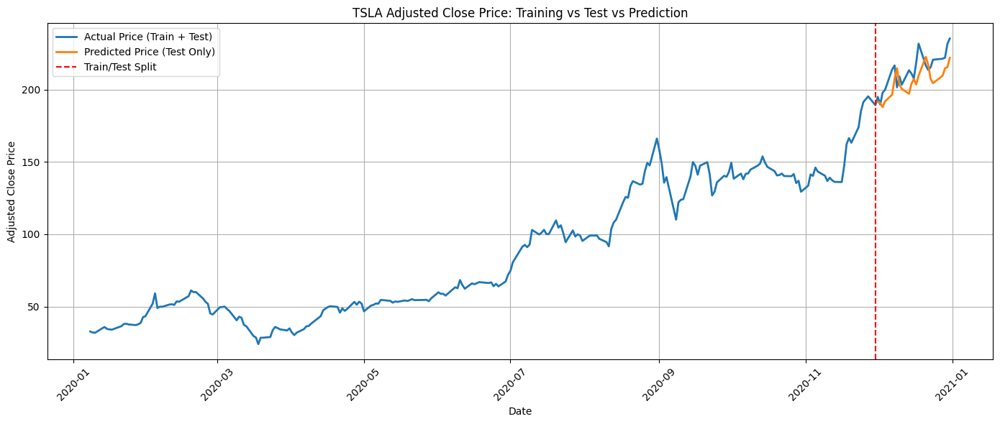

In [867]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt

# Load and preprocess
df = pd.read_csv("tsla_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Use only 'Adj Close'
adj_close = df[['Adj Close']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(adj_close)

# Generate 5-day sequences
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i - 5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predict 'Adj Close'

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split on 2020-11-30
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Define and train LSTM model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, epochs=200, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform
y_pred_actual = scaler.inverse_transform(predictions)
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices].flatten(),
    "Predicted": y_pred_actual[valid_indices].flatten(),
    "Absolute Error": np.abs(y_test_actual[valid_indices].flatten() - y_pred_actual[valid_indices].flatten())
})

print(results)

# Visualize predictions vs training data
all_y = np.concatenate((y_train, y_test)).reshape(-1, 1)
all_y_actual = scaler.inverse_transform(all_y)

full_dates = sequence_dates

plt.figure(figsize=(14, 6))
plt.plot(full_dates, all_y_actual, label='Actual Price (Train + Test)', linewidth=2)
plt.plot(test_dates, y_pred_actual, label='Predicted Price (Test Only)', linewidth=2)
plt.axvline(pd.to_datetime("2020-11-30"), color='red', linestyle='--', label='Train/Test Split')
plt.title("TSLA Adjusted Close Price: Training vs Test vs Prediction")
plt.xlabel("Date")
plt.ylabel("Adjusted Close Price")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [69]:
aapl_data = merged_df[merged_df['ticker'] == 'AAPL']
aapl_data.to_csv("aapl_final.csv")

print(aapl_data.head())

        Date ticker  Adj Close  sentiment_Negative  sentiment_Neutral  \
0 2019-12-31   AAPL  71.520821                   0                  0   
1 2020-01-02   AAPL  73.152649                   0                  0   
2 2020-01-03   AAPL  72.441460                   0                  0   
3 2020-01-06   AAPL  73.018677                   0                  0   
4 2020-01-07   AAPL  72.675278                   0                  1   

   sentiment_Positive  
0                   0  
1                   1  
2                   1  
3                   1  
4                   0  


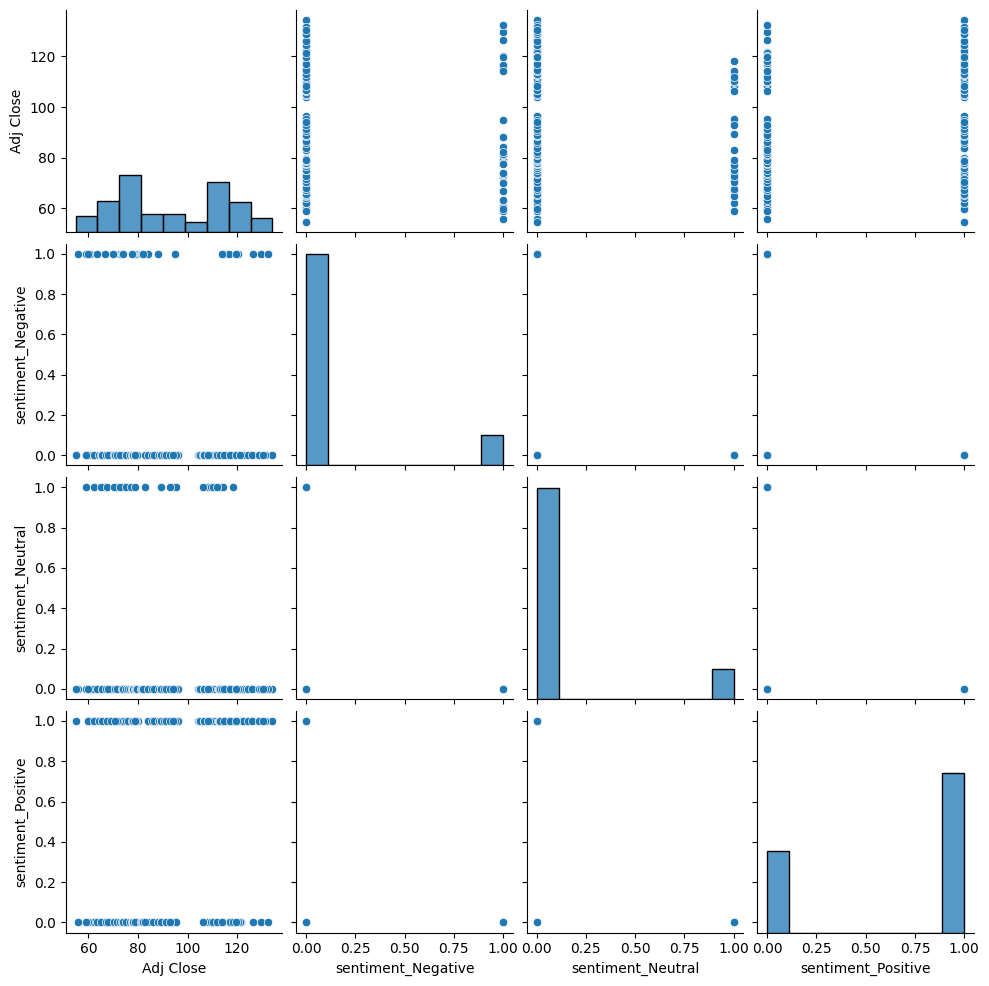

In [71]:
sns.pairplot(aapl_data)

In [73]:
aapl_data.describe()

,Date,Adj Close,sentiment_Negative,sentiment_Neutral,sentiment_Positive
count,254,254.000000,254.000000,254.000000,254.000000
mean,2020-07-01 19:16:32.125984256,93.308248,0.125984,0.125984,0.661417
min,2019-12-31 00:00:00,54.776802,0.000000,0.000000,0.000000
25%,2020-04-01 06:00:00,75.390965,0.000000,0.000000,0.000000
50%,2020-07-01 12:00:00,89.518562,0.000000,0.000000,1.000000
75%,2020-09-30 18:00:00,113.534906,0.000000,0.000000,1.000000
max,2020-12-31 00:00:00,134.317825,1.000000,1.000000,1.000000
std,NaN,21.574201,0.332487,0.332487,0.474162


In [75]:
aapl_data.shape

(254, 6)

In [89]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load and preprocess
df = pd.read_csv("tsla_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Use a 5-day sequence 
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i-5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split on 2020-11-30
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Define and train model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, epochs=50, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)


Epoch 1/50


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0939 - val_loss: 0.1673
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0260 - val_loss: 0.0927
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0140 - val_loss: 0.0350
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0047 - val_loss: 0.0038
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0024 - val_loss: 0.0050
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0018 - val_loss: 0.0026
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0019 - val_loss: 0.0020
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016 - val_loss: 0.0019
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018 - val_loss: 0.0020
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 0.0022
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 0.0020
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0020 - val_loss: 0.0

In [93]:
model.save_weights("tsla_modelv1.weights.h5")

In [79]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load and preprocess
df = pd.read_csv("tsla_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Use a 5-day sequence 
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i-5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split on 2020-11-30
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Define and train model with mild dropout
model = Sequential()
model.add(LSTM(
    50,
    dropout=0.1,              # Mild input dropout
    recurrent_dropout=0.0,    # No recurrent dropout
    input_shape=(x_train.shape[1], x_train.shape[2])
))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, epochs=50, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)



Epoch 1/50


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0575 - val_loss: 0.1188
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0274 - val_loss: 0.1082
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0179 - val_loss: 0.0244
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0130 - val_loss: 0.0184
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0100 - val_loss: 0.0103
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0093 - val_loss: 0.0150
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0135 - val_loss: 0.0105
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0215 - val_loss: 0.0207
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0127 - val_loss: 0.0120
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0097 - val_loss: 0.0129
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0140 - val_loss: 0.0180
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0108 - val_loss: 0.0096

In [81]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping

# Load and preprocess
df = pd.read_csv("tsla_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Use a 5-day sequence 
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i-5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split on 2020-11-30
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Add EarlyStopping
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

# Define and train model with 200 epochs and early stopping
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(
    x_train, y_train,
    epochs=200,              # increased epochs
    batch_size=16,
    validation_data=(x_test, y_test),
    callbacks=[early_stop],  # early stopping added
    verbose=1
)

# Predict
predictions = model.predict(x_test)

# Inverse transform
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)



Epoch 1/200


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.1082 - val_loss: 0.1589
Epoch 2/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0315 - val_loss: 0.1191
Epoch 3/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0179 - val_loss: 0.0475
Epoch 4/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0059 - val_loss: 0.0035
Epoch 5/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023 - val_loss: 0.0042
Epoch 6/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0018 - val_loss: 0.0031
Epoch 7/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016 - val_loss: 0.0021
Epoch 8/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016 - val_loss: 0.0025
Epoch 9/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017 - val_loss: 0.0030
Epoch 10/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018 - val_loss: 0.0024
Epoch 11/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 0.0022
Epoch 12/200
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017 - val_l

In [115]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load and preprocess
df = pd.read_csv("aapl_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Use a 5-day sequence 
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i-5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split on 2020-11-30
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Define and train model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, epochs=50, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.3349 - val_loss: 0.3498
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0507 - val_loss: 0.0445
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.0345 - val_loss: 0.1039
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0205 - val_loss: 0.0838
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0130 - val_loss: 0.0459
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0103 - val_loss: 0.0448
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0070 - val_loss: 0.0256
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0052 - val_loss: 0.0187
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0039 - val_loss: 0.0099
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0027 - val_loss: 0.0055
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0029 - val_loss: 0.0024
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0023 - val

In [121]:
#Perform GridSearchCV for AAPL to find the best parameters

In [85]:
#below I applied the transfer learning to AAPL dataset

In [95]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load and preprocess AAPL dataset
df = pd.read_csv("aapl_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Create 5-day sequences
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i - 5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split data on 2020-11-30 
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Rebuild model with same structure and load TSLA weights
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Load pretrained TSLA weights
model.load_weights("tsla_modelv1.weights.h5")

# Fine-tune the model on AAPL data
model.fit(x_train, y_train, epochs=50, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict on AAPL test data
predictions = model.predict(x_test)

# Inverse transform predictions
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)


Epoch 1/50


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 12 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0021 - val_loss: 0.0022
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026 - val_loss: 9.5924e-04
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0020 - val_loss: 9.2768e-04
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0019 - val_loss: 0.0021
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0017 - val_loss: 0.0017
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 0.0016
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017 - val_loss: 0.0012
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0018 - val_loss: 0.0014
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 0.0012
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017 - val_loss: 0.0016
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 6.9820e-04
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0019 - val_

In [97]:
ba_data = merged_df[merged_df['ticker'] == 'BA']
ba_data.to_csv("ba_final.csv")

print(ba_data.head())

          Date ticker   Adj Close  sentiment_Negative  sentiment_Neutral  \
508 2019-12-31     BA  323.833313                   0                  0   
509 2020-01-02     BA  331.348572                   0                  0   
510 2020-01-03     BA  330.791901                   0                  0   
511 2020-01-06     BA  331.766083                   0                  0   
512 2020-01-07     BA  335.285156                   0                  1   

     sentiment_Positive  
508                   0  
509                   0  
510                   0  
511                   0  
512                   0  


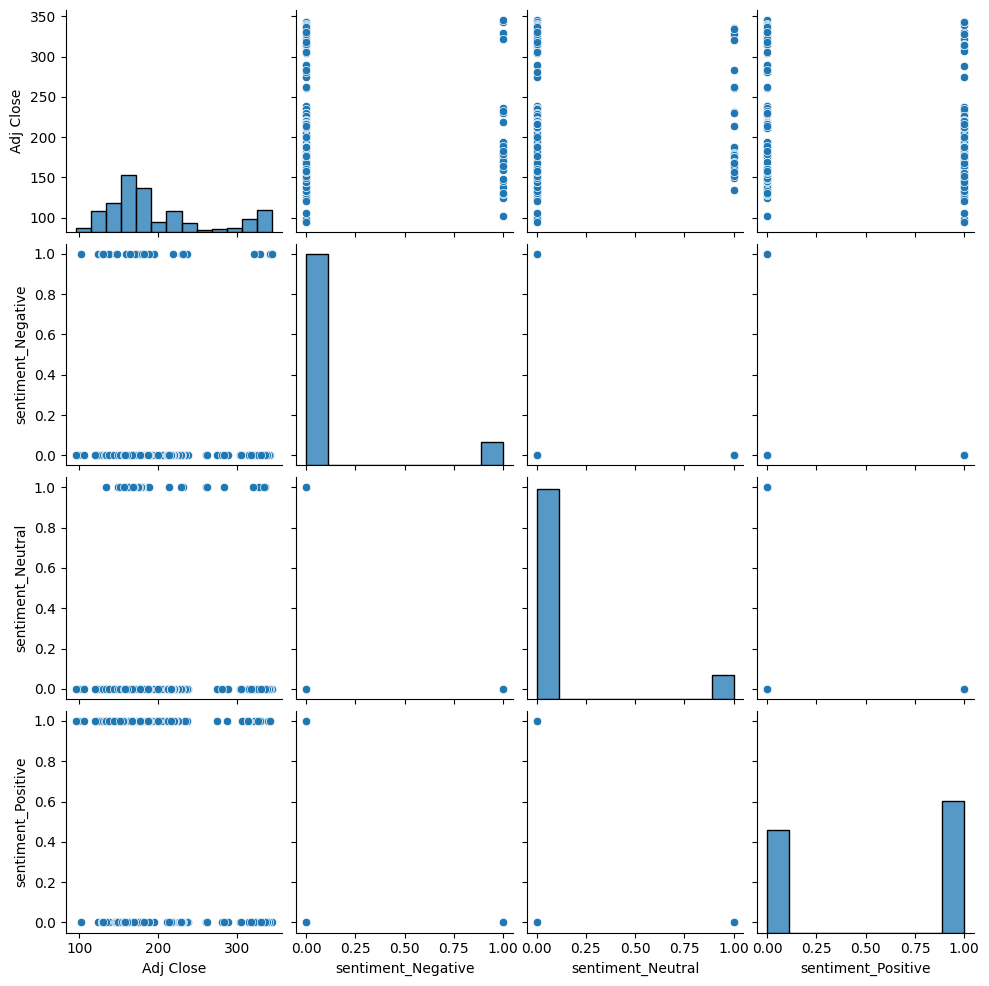

In [676]:
sns.pairplot(ba_data)

In [678]:
ba_data.describe()

,Date,Adj Close,sentiment_Negative,sentiment_Neutral,sentiment_Positive
count,254,254.000000,254.000000,254.000000,254.000000
mean,2020-07-01 19:16:32.125984256,197.372358,0.098425,0.102362,0.562992
min,2019-12-31 00:00:00,95.010002,0.000000,0.000000,0.000000
25%,2020-04-01 06:00:00,156.462505,0.000000,0.000000,0.000000
50%,2020-07-01 12:00:00,174.574997,0.000000,0.000000,1.000000
75%,2020-09-30 18:00:00,219.177498,0.000000,0.000000,1.000000
max,2020-12-31 00:00:00,345.395020,1.000000,1.000000,1.000000
std,NaN,64.251884,0.298477,0.303723,0.496995


In [680]:
ba_data.shape

(254, 6)

In [682]:
#Again the BA databset isn't normallly distributed, therefore we can apply the min max scaler. And we have the same variables so we can apply
#the learning from tsla and appl datasets

In [99]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load and preprocess BA dataset
df = pd.read_csv("ba_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Create 5-day sequences
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i - 5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split data on 2020-11-30 
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Rebuild model with same structure and load AAPL and TSLA weights
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Load pretrained AAPL & TSLA weights
model.load_weights("aapl_model_from_tsla.weights.h5")

# Fine-tune the model on BA data
model.fit(x_train, y_train, epochs=50, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict on BA test data
predictions = model.predict(x_test)

# Inverse transform predictions
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)

Epoch 1/50


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 12 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0050 - val_loss: 5.3413e-04
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0034 - val_loss: 9.3275e-04
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0028 - val_loss: 5.9596e-04
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0028 - val_loss: 5.2990e-04
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0023 - val_loss: 6.0205e-04
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0026 - val_loss: 5.4112e-04
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0028 - val_loss: 6.2210e-04
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028 - val_loss: 6.3615e-04
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0024 - val_loss: 7.4918e-04
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0017 - val_loss: 5.5494e-04
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0018 - val_loss: 8.4837e-04
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 

In [101]:
#Again I converted the GridSeqrchCV to raw as it's slowing down the file. But I saved the results and applied the parameters to the final dataset

In [686]:
# The model didn't predict the spike in sharepice on the 3rd of Dec. Looking at the tweets there was a large order for airplans that was out of the blue
# therefore the LTSM model didn't capture this as it's based on historic data. ....discuss further in word doc about limitations of this model 
# and how we could improve it. e.g. include financal news, journalist someone who are closer to news like this.

In [105]:
#learnings will be applied in final set of datasets. convert below to raw

In [690]:
# save the learnings again from the three dataset and apply to next one

In [107]:
dis_data = merged_df[merged_df['ticker'] == 'DIS']
dis_data.to_csv("dis_final.csv")

print(dis_data.head())

          Date ticker   Adj Close  sentiment_Negative  sentiment_Neutral  \
762 2019-12-31    DIS  144.160172                   0                  0   
763 2020-01-02    DIS  147.718567                   0                  1   
764 2020-01-03    DIS  146.024094                   0                  0   
765 2020-01-06    DIS  145.176849                   0                  0   
766 2020-01-07    DIS  145.226685                   1                  0   

     sentiment_Positive  
762                   0  
763                   0  
764                   0  
765                   0  
766                   0  


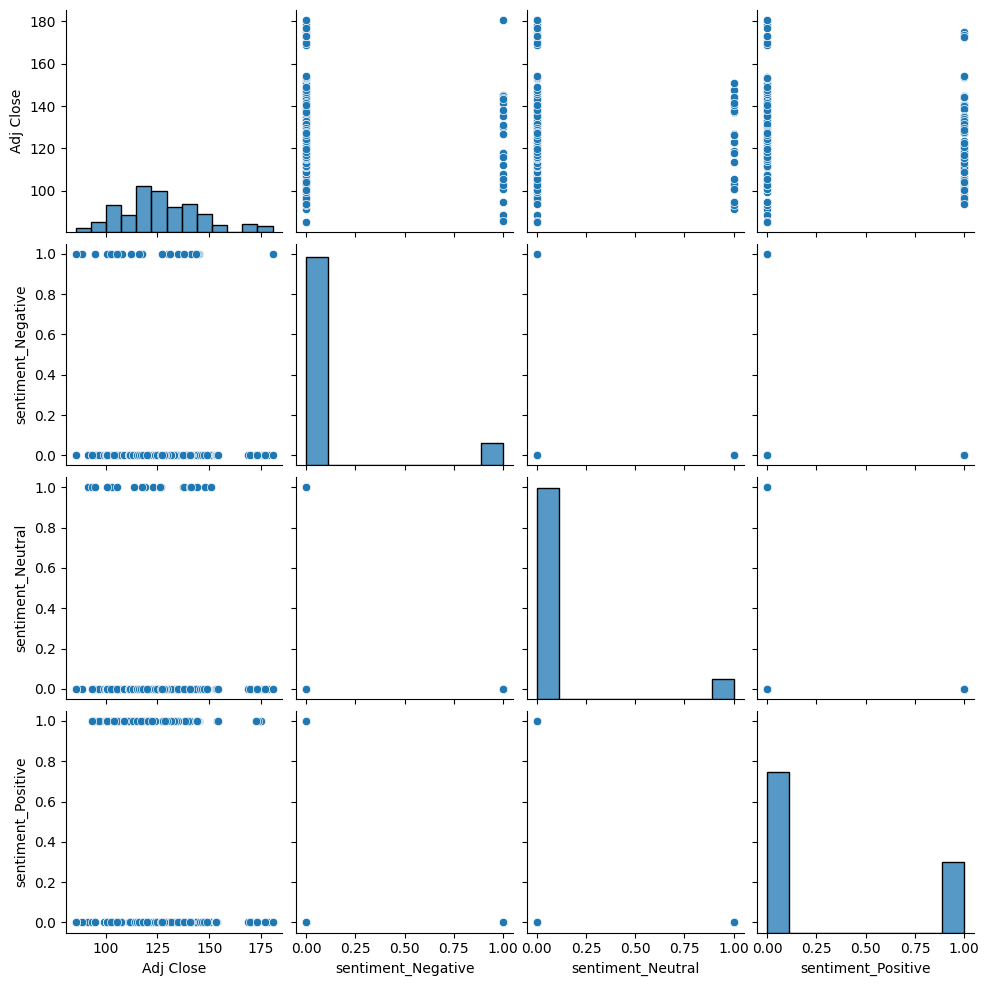

In [694]:
sns.pairplot(dis_data)

In [698]:
dis_data.describe()

,Date,Adj Close,sentiment_Negative,sentiment_Neutral,sentiment_Positive
count,254,254.000000,254.000000,254.000000,254.000000
mean,2020-07-01 19:16:32.125984256,126.062771,0.098425,0.086614,0.307087
min,2019-12-31 00:00:00,85.481407,0.000000,0.000000,0.000000
25%,2020-04-01 06:00:00,115.144733,0.000000,0.000000,0.000000
50%,2020-07-01 12:00:00,123.751682,0.000000,0.000000,0.000000
75%,2020-09-30 18:00:00,138.645641,0.000000,0.000000,1.000000
max,2020-12-31 00:00:00,180.591431,1.000000,1.000000,1.000000
std,NaN,19.043520,0.298477,0.281824,0.462196


In [708]:
#Again the DIS databset isn't normallly distributed, therefore we can apply the min max scaler. And we have the same variables so we can apply
#the learning from tsla, appl and BA datasets

In [702]:
dis_data.shape

(254, 6)

In [109]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load and preprocess DIS dataset
df = pd.read_csv("dis_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Create 5-day sequences
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i - 5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split data on 2020-11-30 
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Rebuild model with same structure and load AAPL and TSLA weights
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Load pretrained BA, AAPL & TSLA weights
model.load_weights("ba_model_from_appl_tsla.weights.h5")

# Fine-tune the model on DIS data
model.fit(x_train, y_train, epochs=50, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict on DIS test data
predictions = model.predict(x_test)

# Inverse transform predictions
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)

Epoch 1/50


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 12 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 0.0016 - val_loss: 0.0042
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0016 - val_loss: 0.0031
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013 - val_loss: 0.0039
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0015 - val_loss: 0.0034
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012 - val_loss: 0.0027
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 0.0026
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014 - val_loss: 0.0028
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0011 - val_loss: 0.0027
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0013 - val_loss: 0.0027
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012 - val_loss: 0.0028
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0013 - val_loss: 0.0028
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014 - val_loss: 0.0

In [117]:
#convert gridserachcv to raw as it's slowing the file. I saved the results below and applied them to final mddel

In [157]:
# the best parameters for the DIS dataset are: 'batch_size': 8, 'epochs': 100, 'model__optimizer': 'adam', 'model__units': 50  which I will apply to the last version on BA so it feeds into the dashbaord

In [113]:
#again convert below to raw as I apply transfer learning to final dataset

In [722]:
#save the learnings from the 4 models 

In [111]:
amzn_data = merged_df[merged_df['ticker'] == 'AMZN']
amzn_data.to_csv("amzn_final.csv")

print(amzn_data.head())

          Date ticker  Adj Close  sentiment_Negative  sentiment_Neutral  \
254 2019-12-31   AMZN  92.391998                   0                  0   
255 2020-01-02   AMZN  94.900497                   0                  0   
256 2020-01-03   AMZN  93.748497                   0                  0   
257 2020-01-06   AMZN  95.143997                   1                  0   
258 2020-01-07   AMZN  95.343002                   0                  0   

     sentiment_Positive  
254                   0  
255                   0  
256                   1  
257                   0  
258                   1  


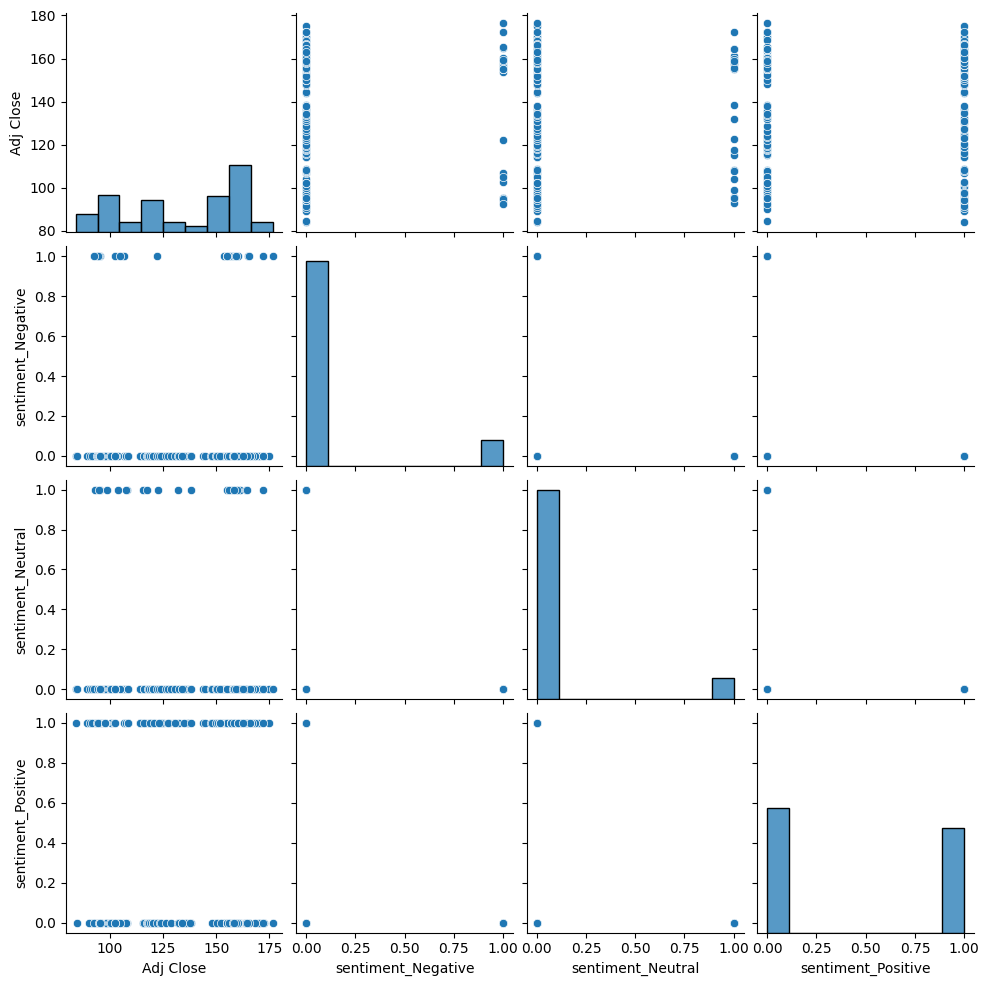

In [712]:
sns.pairplot(amzn_data)

In [714]:
amzn_data.describe()

,Date,Adj Close,sentiment_Negative,sentiment_Neutral,sentiment_Positive
count,254,254.000000,254.000000,254.000000,254.000000
mean,2020-07-01 19:16:32.125984256,133.878775,0.110236,0.090551,0.456693
min,2019-12-31 00:00:00,83.830498,0.000000,0.000000,0.000000
25%,2020-04-01 06:00:00,106.931000,0.000000,0.000000,0.000000
50%,2020-07-01 12:00:00,144.224998,0.000000,0.000000,0.000000
75%,2020-09-30 18:00:00,158.250496,0.000000,0.000000,1.000000
max,2020-12-31 00:00:00,176.572495,1.000000,1.000000,1.000000
std,NaN,27.359174,0.313802,0.287536,0.499104


In [718]:
#Again the AMZN databset isn't normallly distributed, therefore we can apply the min max scaler. And we have the same variables so we can apply
#the learning from tsla, appl and BA datasets

In [716]:
amzn_data.shape

(254, 6)

In [115]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load and preprocess AMZN dataset
df = pd.read_csv("amzn_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Create 5-day sequences
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i - 5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split data on 2020-11-30 
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Rebuild model with same structure and load BA, DIS, AAPL and TSLA weights
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Load pretrained DIS, BA, AAPL & TSLA weights
model.load_weights("dis_model_from_ba_appl_tsla.weights.h5")

# Fine-tune the model on AMZN data
model.fit(x_train, y_train, epochs=50, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict on AMZN test data
predictions = model.predict(x_test)

# Inverse transform predictions
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)

Epoch 1/50


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 12 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0019 - val_loss: 6.8641e-04
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015 - val_loss: 7.1874e-04
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0015 - val_loss: 6.0328e-04
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0015 - val_loss: 7.7596e-04
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0016 - val_loss: 6.5465e-04
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014 - val_loss: 5.0929e-04
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0013 - val_loss: 6.9388e-04
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0012 - val_loss: 5.8392e-04
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014 - val_loss: 6.8961e-04
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0014 - val_loss: 4.9853e-04
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0015 - val_loss: 5.1906e-04
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━

In [119]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Load and preprocess
df = pd.read_csv("amzn_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Use a 5-day sequence 
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = []
    for j in range(i-5, i):
        x_step.append(scaled[j])
    x_data.append(x_step)
    y_data.append(scaled[i, 0])  # Predicting 'Adj Close' on day i

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split on 2020-11-30
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Define and train model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, epochs=50, batch_size=16, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices])
})

print(results)


Epoch 1/50


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.2662 - val_loss: 0.1398
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0516 - val_loss: 0.0040
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0298 - val_loss: 0.0178
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0176 - val_loss: 0.0060
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0098 - val_loss: 0.0013
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0058 - val_loss: 0.0011
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step - loss: 0.0040 - val_loss: 0.0011
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0028 - val_loss: 0.0017
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0030 - val_loss: 0.0022
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0026 - val_loss: 0.0021
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0024 - val_loss: 0.0024
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 0.0025 - val_loss: 0.002

In [189]:
#Best Parameters Found fro AMZN: {'batch_size': 8, 'epochs': 100, 'model__units': 64}

#Best Parameters to use for each model (note when using transfer learing we musst have the same model settings, so I've picked the most appropriate):

TSLA	Best Parameters Found: {'batch_size': 8, 'epochs': 100, 'model__optimizer': 'adam', 'model__units': 64}				
AAPL	# the best paramaters are:batch_size': 8, 'epochs': 100, 'model__units': 50} I will apply these to the final code for appl which gets picked up in the dashboard. 				
BA	# the best parameters for the BA dataset are: 'batch_size': 8, 'epochs': 50, 'model__optimizer': 'adam', 'model__units': 50  which I will apply to the last version on BA so it feeds into the dashbaord				
DIS	# the best parameters for the DIS dataset are: 'batch_size': 8, 'epochs': 10, 'model__optimizer': 'adam', 'model__units': 50  which I will apply to the last version on BA so it feeds into the dashbaord				
AMZN	#Best Parameters Found: {'batch_size': 8, 'epochs': 100, 'model__units': 64}				
					
					
	TSLA	AAPL	BA	DIS	AMZN
Batch	8	8	8	8	8
Epoch	100	100	50	100	100
Model Units	64	50	50	50	50
					
					
Batch	8				
Epoch	100				
Model Units	50				

In [732]:
#the results are significantly better in the previous model when I included the other model outcomes...discuss more in word doc

In [750]:
# lastly I need to display the results on a dynamic dashbaord. I could copy and paste the results into the code for saod dashbaord

In [752]:
# I will only prepare the dashboard for the LSTM model as it contains more accurate results compare to the autoregressive model

In [754]:
# I will save the results for the models I ran, and then pass the results into to dashboard. That way we're using dynamic data instead of static

In [149]:
all_results = pd.DataFrame()

In [159]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# save results to DataFrame
#all_results = pd.DataFrame()

# Load and preprocess
df = pd.read_csv("tsla_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalise features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Create 5-day sequences
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = [scaled[j] for j in range(i - 5, i)]
    x_data.append(x_step)
    y_data.append(scaled[i, 0])

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split on 2020-11-30
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Define and train model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(x_train, y_train, epochs=100, batch_size=8, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

# Create results DataFrame for TSLA
results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices]),
    "Ticker": "TSLA"
})

# Append to master results DataFrame
all_results = pd.concat([all_results, results], ignore_index=True)

# Show in-memory stored results
print(all_results)


Epoch 1/100


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


29/29 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0710 - val_loss: 0.1390
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0170 - val_loss: 0.0259
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0033 - val_loss: 0.0043
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0018 - val_loss: 0.0019
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0019 - val_loss: 0.0029
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0015 - val_loss: 0.0022
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0013 - val_loss: 0.0018
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0020 - val_loss: 0.0024
Epoch 10/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0016 - val_loss: 0.0030
Epoch 11/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0016 - val_loss: 0.0020
Epoch 12/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0013 - val_l

In [161]:
model.save_weights("tsla_model.weights.h5")

In [163]:
print(results)

        Date      Actual   Predicted  Absolute Error Ticker
0 2020-12-01  194.919998  193.982517        0.937481   TSLA
1 2020-12-03  197.793335  199.950635        2.157300   TSLA
2 2020-12-09  201.493332  209.452519        7.959187   TSLA


In [165]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# save results to DataFrame
#all_results = pd.DataFrame()

# Load and preprocess AAPL dataset
df = pd.read_csv("aapl_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalize features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Create 5-day sequences
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = [scaled[j] for j in range(i - 5, i)]
    x_data.append(x_step)
    y_data.append(scaled[i, 0])

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split data on 2020-11-30 
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Build and fine-tune model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Load TSLA pretrained weights
model.load_weights("tsla_model.weights.h5")

# Fine-tune on AAPL data
model.fit(x_train, y_train, epochs=100, batch_size=8, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform predictions
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

# Store AAPL results in a DataFrame
results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices]),
    "Ticker": "AAPL"
})

# Append to shared results storage
all_results = pd.concat([all_results, results], ignore_index=True)

# Show in-memory results
print(all_results)


Epoch 1/100


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 12 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 0.0017 - val_loss: 0.0031
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0040
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 0.0018
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0011 - val_loss: 7.0967e-04
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0015 - val_loss: 9.0297e-04
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0012
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0017
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 7.3335e-04
Epoch 10/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0016 - val_loss: 6.6289e-04
Epoch 11/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0023
Epoch 12/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss

In [167]:
model.save_weights("aapl_model_from_tsla.weights.h5")

In [169]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# save results to DataFrame
#all_results = pd.DataFrame()

# Load and preprocess BA dataset
df = pd.read_csv("ba_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalize features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Create 5-day sequences
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = [scaled[j] for j in range(i - 5, i)]
    x_data.append(x_step)
    y_data.append(scaled[i, 0])

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split data on 2020-11-30 
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Build and fine-tune model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Load AAPL and TSLA pretrained weights
model.load_weights("aapl_model_from_tsla.weights.h5")

# Fine-tune on BA data
model.fit(x_train, y_train, epochs=100, batch_size=8, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform predictions
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

# Store BA results in a DataFrame
results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices]),
    "Ticker": "BA"
})

# Append to shared results storage
all_results = pd.concat([all_results, results], ignore_index=True)

# Show in-memory results
print(all_results)


Epoch 1/100


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 12 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0030 - val_loss: 6.8631e-04
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0022 - val_loss: 3.0013e-04
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0017 - val_loss: 3.7784e-04
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0016 - val_loss: 6.2668e-04
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0016 - val_loss: 6.4749e-04
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0017 - val_loss: 4.8690e-04
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0010 - val_loss: 3.6083e-04
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0014 - val_loss: 4.1691e-04
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0015 - val_loss: 5.7396e-04
Epoch 10/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0014 - val_loss: 6.2883e-04
Epoch 11/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0014 - val_loss: 4.3785e-04
Epoch 12/100
29/29 ━━━━━━━━━━━

In [171]:
model.save_weights("ba_model_from_appl_tsla.weights.h5")

In [173]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# save results to DataFrame
#all_results = pd.DataFrame()

# Load and preprocess DIS dataset
df = pd.read_csv("dis_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalize features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Create 5-day sequences
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = [scaled[j] for j in range(i - 5, i)]
    x_data.append(x_step)
    y_data.append(scaled[i, 0])

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split data on 2020-11-30 
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Build and fine-tune model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Load BA, AAPL and TSLA pretrained weights
model.load_weights("ba_model_from_appl_tsla.weights.h5")

# Fine-tune on DIS data
model.fit(x_train, y_train, epochs=100, batch_size=8, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform predictions
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

# Store DIS results in a DataFrame
results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices]),
    "Ticker": "DIS"
})

# Append to shared results storage
all_results = pd.concat([all_results, results], ignore_index=True)

# Show in-memory results
print(all_results)


Epoch 1/100


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 12 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 0.0018 - val_loss: 0.0039
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0037
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0058
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0014 - val_loss: 0.0085
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_loss: 0.0043
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0060
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0045
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0013 - val_loss: 0.0083
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0076
Epoch 10/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0012 - val_loss: 0.0078
Epoch 11/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0011 - val_loss: 0.0088
Epoch 12/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.0010 - val_l

In [175]:
model.save_weights("dis_model_from_ba_appl_tsla.weights.h5")

In [177]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# save results to DataFrame
#all_results = pd.DataFrame()

# Load and preprocess AMZN dataset
df = pd.read_csv("amzn_final.csv")
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Normalize features
features = df[['Adj Close', 'sentiment_Negative', 'sentiment_Neutral', 'sentiment_Positive']]
scaler = MinMaxScaler()
scaled = scaler.fit_transform(features)

# Create 5-day sequences
x_data, y_data = [], []
dates = df.index
for i in range(5, len(scaled)):
    x_step = [scaled[j] for j in range(i - 5, i)]
    x_data.append(x_step)
    y_data.append(scaled[i, 0])

x_data, y_data = np.array(x_data), np.array(y_data)
sequence_dates = dates[5:]

# Split data on 2020-11-30 
split_date = pd.to_datetime("2020-11-30")
split_index = np.argmax(sequence_dates > split_date)

x_train, x_test = x_data[:split_index], x_data[split_index:]
y_train, y_test = y_data[:split_index], y_data[split_index:]
test_dates = sequence_dates[split_index:]

# Build and fine-tune model
model = Sequential()
model.add(LSTM(50, input_shape=(x_train.shape[1], x_train.shape[2])))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mean_squared_error')

# Load DIS, BA, AAPL and TSLA pretrained weights
model.load_weights("dis_model_from_ba_appl_tsla.weights.h5")

# Fine-tune on AZMN data
model.fit(x_train, y_train, epochs=100, batch_size=8, validation_data=(x_test, y_test), verbose=1)

# Predict
predictions = model.predict(x_test)

# Inverse transform predictions
y_pred_padded = np.hstack((predictions, np.zeros((len(predictions), 3))))
y_test_padded = np.hstack((y_test.reshape(-1, 1), np.zeros((len(y_test), 3))))
y_pred_actual = scaler.inverse_transform(y_pred_padded)[:, 0]
y_test_actual = scaler.inverse_transform(y_test_padded)[:, 0]

# Select Dec 1, 3, and 7 predictions
december_indices = [i for i, d in enumerate(test_dates) if d.month == 12]
target_days = [0, 2, 6]
valid_indices = [december_indices[i] for i in target_days if i < len(december_indices)]

# Store AMZN results in a DataFrame
results = pd.DataFrame({
    "Date": test_dates[valid_indices],
    "Actual": y_test_actual[valid_indices],
    "Predicted": y_pred_actual[valid_indices],
    "Absolute Error": np.abs(y_test_actual[valid_indices] - y_pred_actual[valid_indices]),
    "Ticker": "AMZN"
})

# Append to shared results storage
all_results = pd.concat([all_results, results], ignore_index=True)

# Show in-memory results
print(all_results)


Epoch 1/100


C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
C:\Users\fergu\anaconda3\envs\tf_env\lib\site-packages\keras\src\saving\saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 12 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


29/29 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 0.0016 - val_loss: 4.7282e-04
Epoch 2/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0016 - val_loss: 5.6619e-04
Epoch 3/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0014 - val_loss: 5.5188e-04
Epoch 4/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0014 - val_loss: 5.2218e-04
Epoch 5/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0013 - val_loss: 6.6607e-04
Epoch 6/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0015 - val_loss: 3.9226e-04
Epoch 7/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0011 - val_loss: 7.9227e-04
Epoch 8/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0015 - val_loss: 4.8749e-04
Epoch 9/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0013 - val_loss: 3.2493e-04
Epoch 10/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 0.0012 - val_loss: 4.0394e-04
Epoch 11/100
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0012 - val_loss: 5.3957e-04
Epoch 12/100
29/29 ━━━━━━━━━━━

In [185]:
#first iteration of dashboard- convert to raw

In [179]:
import pandas as pd

# Define the raw data
data = {
    "Date": [
        "2020-12-01", "2020-12-03", "2020-12-09",
        "2020-12-01", "2020-12-03", "2020-12-09",
        "2020-12-01", "2020-12-03", "2020-12-09",
        "2020-12-01", "2020-12-03", "2020-12-09",
        "2020-12-01", "2020-12-03", "2020-12-09"
    ],
    "Actual": [
        120.590256, 120.806435, 119.666588,  # AAPL
        194.919998, 197.793335, 201.493332,  # TSLA
        213.009995, 237.199997, 232.059998,  # BA
        148.954544, 152.742203, 153.928329,  # DIS
        161.003998, 159.336502, 155.210007   # AMZN
    ],
    "Predicted": [
        117.096241, 117.410225, 118.392607,  # AAPL
        189.593596, 188.305381, 193.182680,  # TSLA
        211.145694, 211.700054, 210.501208,  # BA
        148.199407, 148.322456, 149.631053,  # DIS
        158.697257, 159.417571, 160.946615   # AMZN
    ],
    "Ticker": [
        "AAPL", "AAPL", "AAPL",
        "TSLA", "TSLA", "TSLA",
        "BA", "BA", "BA",
        "DIS", "DIS", "DIS",
        "AMZN", "AMZN", "AMZN"
    ]
}

# Create DataFrame
sarimax_results = pd.DataFrame(data)

# Convert Date column to datetime
sarimax_results["Date"] = pd.to_datetime(sarimax_results["Date"])

# Add the model label
sarimax_results["Model"] = "SARIMAX"

# Display
print(sarimax_results.head())


        Date      Actual   Predicted Ticker    Model
0 2020-12-01  120.590256  117.096241   AAPL  SARIMAX
1 2020-12-03  120.806435  117.410225   AAPL  SARIMAX
2 2020-12-09  119.666588  118.392607   AAPL  SARIMAX
3 2020-12-01  194.919998  189.593596   TSLA  SARIMAX
4 2020-12-03  197.793335  188.305381   TSLA  SARIMAX


In [187]:
#Second iteration of dashboard- convert to raw

In [181]:
import pandas as pd
import plotly.graph_objects as go

# Add model labels if not already present
all_results["Model"] = "LSTM"
sarimax_results["Model"] = "SARIMAX"

# Combine the results
combined_df = pd.concat([all_results, sarimax_results], ignore_index=True)
combined_df["Date"] = pd.to_datetime(combined_df["Date"])

# Unique tickers
tickers = combined_df["Ticker"].unique().tolist()

# Initialize traces and visibility map
traces = []
visibility_matrix = []

for i, ticker in enumerate(tickers):
    ticker_df = combined_df[combined_df["Ticker"] == ticker]

    # Only get 'Actual' values from one source, e.g. LSTM
    actual_df = ticker_df[ticker_df["Model"] == "LSTM"][["Date", "Actual"]].drop_duplicates()

    # Actual line
    traces.append(go.Scatter(
        x=actual_df["Date"],
        y=actual_df["Actual"],
        mode="lines+markers",
        name=f"{ticker} Actual",
        visible=(i == 0)
    ))

    # LSTM prediction
    lstm_df = ticker_df[ticker_df["Model"] == "LSTM"]
    traces.append(go.Scatter(
        x=lstm_df["Date"],
        y=lstm_df["Predicted"],
        mode="lines+markers",
        name=f"{ticker} LSTM Predicted",
        visible=(i == 0)
    ))

    # SARIMAX prediction
    sarimax_df = ticker_df[ticker_df["Model"] == "SARIMAX"]
    traces.append(go.Scatter(
        x=sarimax_df["Date"],
        y=sarimax_df["Predicted"],
        mode="lines+markers",
        name=f"{ticker} SARIMAX Predicted",
        visible=(i == 0)
    ))

    # Dropdown visibility setup
    vis = [False] * (len(tickers) * 3)
    vis[i * 3] = True       # Actual
    vis[i * 3 + 1] = True   # LSTM
    vis[i * 3 + 2] = True   # SARIMAX
    visibility_matrix.append((ticker, vis))

# Create figure
fig = go.Figure(data=traces)

# Dropdown for ticker selection
dropdown_buttons = []
for label, vis in visibility_matrix:
    dropdown_buttons.append(dict(
        label=label,
        method="update",
        args=[
            {"visible": vis},
            {"title": f"{label} - Actual vs LSTM and SARIMAX Predictions"}
        ]
    ))

# Update layout
fig.update_layout(
    updatemenus=[dict(
        buttons=dropdown_buttons,
        direction="down",
        showactive=True,
        x=1.15,
        y=1.15,
        xanchor='right',
        yanchor='top'
    )],
    title=f"{tickers[0]} - Actual vs LSTM and SARIMAX Predictions",
    xaxis_title="Date",
    yaxis_title="Price (USD)",
    template="plotly_white"
)

fig.show()
